# Домашнее задание №3

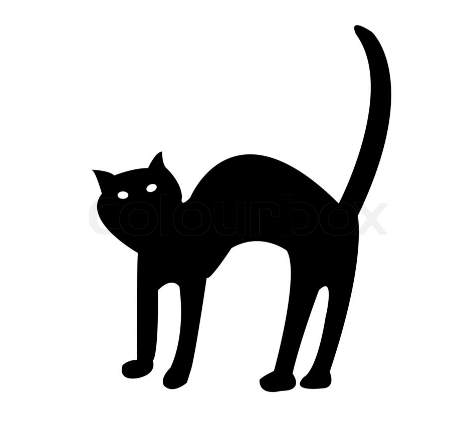

In [31]:
import numpy as np
import cv2
import matplotlib.pylab as plt
%matplotlib inline

def show(img):
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
def show_gray(img):  
    ax = plt.axes([0,0,1,1], frameon=False)
    ax.set_axis_off()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_GRAY2RGB))    

def show_imgs_gray(imgs):
    if (len(imgs) > 3):
        columns_cnt = 3
    else:
        columns_cnt = len(imgs)
    rows_cnt = len(imgs) // columns_cnt + 1   
        
    fig = plt.figure(figsize=(10, 10))
    for count, img in enumerate(imgs):
        a = fig.add_subplot(rows_cnt, columns_cnt, count + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)) 
        
def show_imgs(imgs):
    if (len(imgs) > 3):
        columns_cnt = 3
    else:
        columns_cnt = len(imgs)
    rows_cnt = len(imgs) // columns_cnt + 1   
        
    fig = plt.figure(figsize=(10, 10))
    for count, img in enumerate(imgs):
        a = fig.add_subplot(rows_cnt, columns_cnt, count + 1)
        a.set_axis_off()
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)) 
        
    
cat = cv2.imread("cat.jpg")
show(cat)

start first
end first
start second
end second
number of components 3


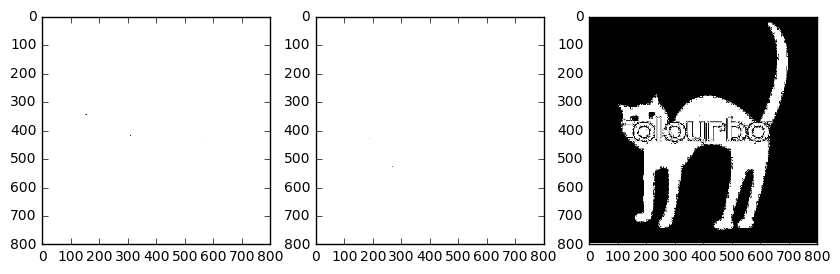

In [45]:
gray = cv2.cvtColor(cat, cv2.COLOR_BGR2GRAY)

struct = np.ndarray(shape=(3,3), buffer=np.array([[,1,1],[1,1,1],[1,1,1]]), dtype=int)
comps = compound_components(gray, struct, 0) 
print('number of components', len(comps))
show_imgs_gray(comps)

**1. (3 балла)** Выделите границы на изображении portrait.jpg:

• при помощи градиента,

• при помощи лапласиана,

• с помощью морфологической обработки.                                                         

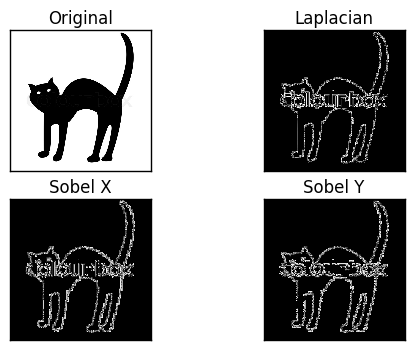

In [2]:
img = cat
laplacian = cv2.Laplacian(img,cv2.CV_64F)
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
 
plt.subplot(2,2,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian,cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

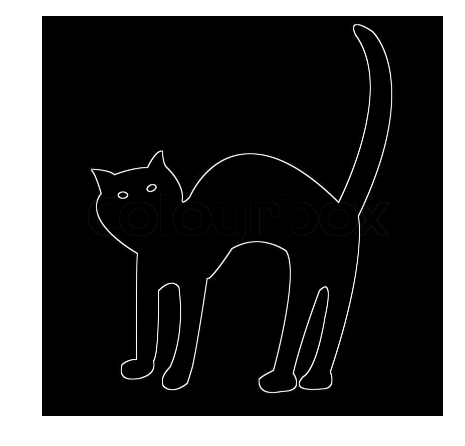

In [3]:
def betta(img):
    kernel = np.ones((5,5),np.uint8)
    erosion = cv2.erode(img, kernel,iterations = 1)
    diff = img.astype("float") - erosion.astype("float")
    
    return diff.astype(np.uint8)


show(betta(cat))

**2. (4 балла)** Реализуйте двухпроходный алгоритм выделения компонент связности на бинарном изображении. Значение фона (0 или 1) и структурный элемент передавайте в качестве параметра.

Если все соседи - пикселы фона (со значением равным нулю), то f(i,j)
 присваивается новая, ранее не использовавшаяся метка.
Если имеется в точности один соседний пиксел с ненулевой меткой, присваиваем эту метку пикселу f(i,j)
Если имеется больше чем один ненулевой пиксел среди соседей, присваиваем метку любого из уже пронумерованных пикселов.

In [39]:
from scipy.stats import itemfreq
def compound_components(src, struct_mat, background):
    c = 0
    
    matrix_of_marks = np.zeros_like(src)
        
    s1, s2 = src.shape
    k1, k2 = struct_mat.shape
    
    table_of_eqv_lst = []
    
    max_mark = 0
    #первый проход
    print('start first')
    for i in np.arange(s1):
        for j in np.arange(s2):
            if (src[i][j] != background):
                lst_of_marks = []
                k1, k2 = struct_mat.shape
                s_i = i - k1 // 2
                s_j = j - k2 // 2

                i2 = 0
                for i1 in np.arange(s_i, s_i + k1, 1):
                    j2 = 0
                    for j1 in np.arange(s_j, s_j + k2, 1):
                        if (i <= k1 or j <= k2 or (s1 - 1) - i <= k1 or (s2 - 1) - j <= k2):
                            matrix_of_marks[i][j] = 0   
                        elif (i1 == i and j1 == j):
                            continue
                        elif (struct_mat[i2][j2] == 1):
                            lst_of_marks.append(matrix_of_marks[i1][j1]) 

                        j2 +=1
                    i2 +=1    
 
                arr = itemfreq(lst_of_marks) 
                f1, f2 = arr.shape
                if (f1 == 1):
                    c = c + 1
                    matrix_of_marks[i][j] = c

                if (f1 == 2):
                    for i3 in np.arange(f1):
                        mark_, cnt_ = arr[i3]
                        if (mark_ != 0):
                            if (mark_ > max_mark):
                                max_mark = mark_
                            matrix_of_marks[i][j] = mark_
                            
                if (f1 > 2):    
                    lst_of_eqv = []
                    for i3 in np.arange(f1):
                        mark_, cnt_ = arr[i3]
                        if (mark_ != 0):
                            if (mark_ > max_mark):
                                max_mark = mark_
                            matrix_of_marks[i][j] = mark_
                            lst_of_eqv.append(mark_)
                    
                    lst_of_eqv.sort()
                    if (lst_of_eqv not in table_of_eqv_lst):
                        table_of_eqv_lst.append(lst_of_eqv)
           
    print('end first')    
    table_of_eqv_lst.sort()
    #второй проход
    print('start second')
    
    for lst_in in table_of_eqv_lst:
        l_ = len(lst_in)
        for k in np.arange(l_ - 1):
            matrix_of_marks[matrix_of_marks == lst_in[k]] = lst_in[k + 1]
    print('end second')      
            
    
    components = []
    unique_values = np.unique(np.array(matrix_of_marks))
    for mark in unique_values:
        if (mark == 0):
            continue
        component = np.zeros_like(src)
        component.fill(255)
        component[matrix_of_marks == mark] = 0
        components.append(component)            
    return components          

Посмотрим на результат работы на примере coins_1.jpg

start first
end first
start second
end second
number of components 9


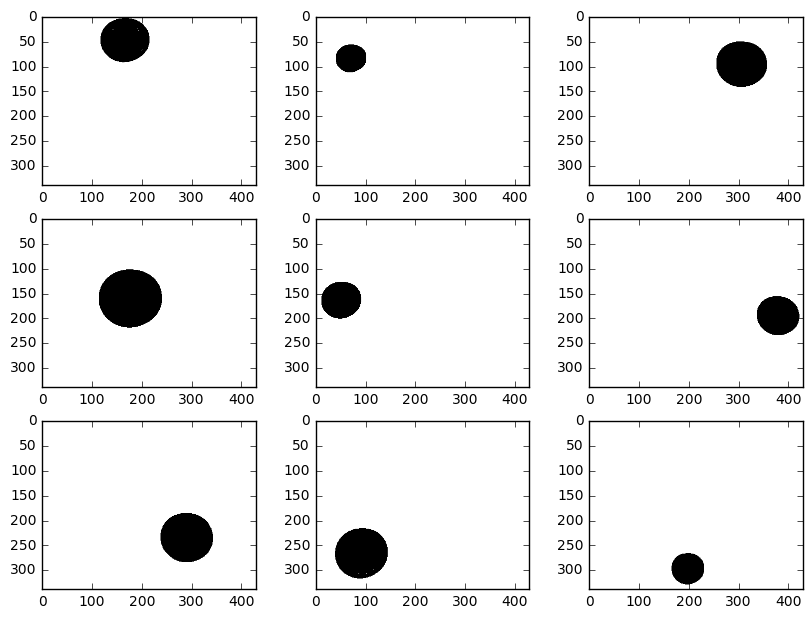

In [5]:
coins_1 = cv2.imread("coins_1.jpg")
im_gray = cv2.cvtColor(coins_1, cv2.COLOR_BGR2GRAY)
thresh, im_bw = cv2.threshold(im_gray, 100, 255, cv2.THRESH_OTSU)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(4,4))
dilation = cv2.dilate(im_bw, kernel, iterations = 2)

struct = np.ndarray(shape=(3,3), buffer=np.array([[0,1,0],[1,1,1],[0,1,0]]), dtype=int)

comps = compound_components(dilation, struct, 0) 
print('number of components', len(comps))
show_imgs_gray(comps)

**3. (5 баллов)** Выделите в изображении $table.jpg$ границы таблицы с использованием морфологических операций. Результатом обработки должно быть изображение, в котором удален весь текст и оставлены только границы таблицы

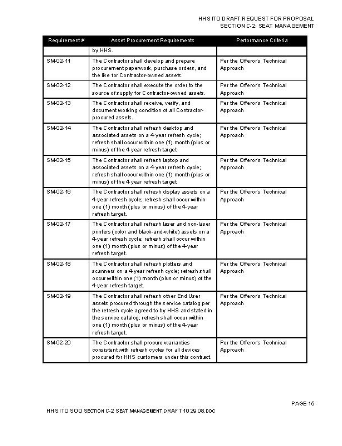

In [6]:
table = cv2.imread("table.jpg")
show(table)

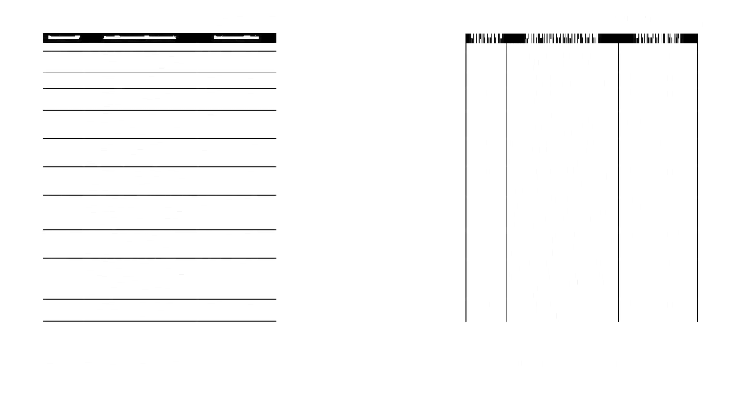

In [7]:
kernel_1 = np.ones((1,10),np.uint8)
closing_1 = cv2.morphologyEx(table, cv2.MORPH_CLOSE, kernel_1)

kernel_2 = np.ones((10,1),np.uint8)
closing_2 = cv2.morphologyEx(table, cv2.MORPH_CLOSE, kernel_2)

show_imgs([closing_1, closing_2])

In [8]:
dst = np.zeros_like(closing_1, np.uint8)
s1, s2 ,s3 = closing_1.shape
for i in np.arange(s1):
    for j in np.arange(s2):
        for k in np.arange(s3):
            dst[i][j][k] = ((int)(closing_1[i][j][k]) + closing_2[i][j][k]) / 2

In [9]:
dst = dst.astype(np.uint8)

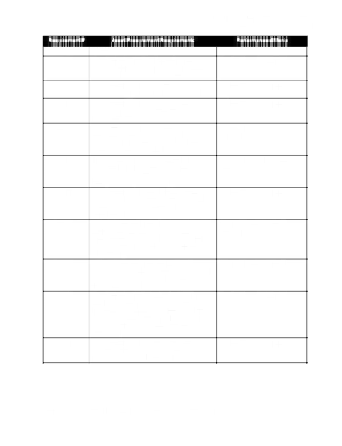

In [10]:
show(dst)

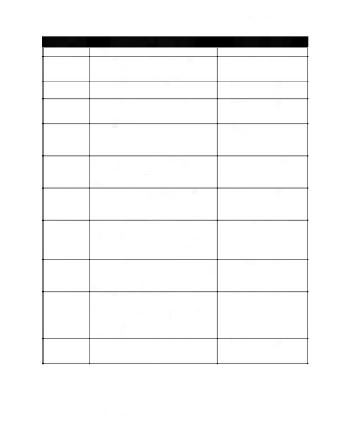

In [11]:
kernel = np.ones((12,12))
opening = cv2.morphologyEx(dst, cv2.MORPH_OPEN, kernel)
show(opening)

**4. (7 баллов)** Для изображения $circles.jpg$ реализуйте морфологический алгоритм для построения трех изображений, которые бы содержали соответственно:

• только частицы, касающиеся краев изображения, 

• только группы перекрывающихся частиц,

• только одиночные круглые частицы.

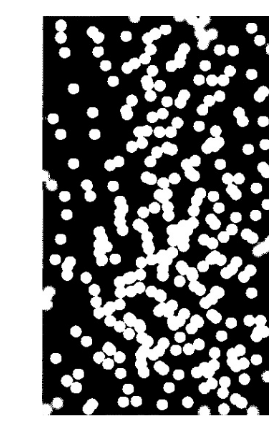

In [12]:
circles = cv2.imread("circles.jpg")

show(circles)

Сначала бинаризуем

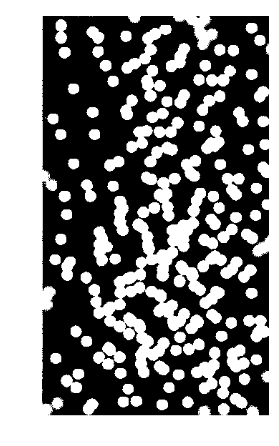

In [13]:
im_gray = cv2.cvtColor(circles, cv2.COLOR_BGR2GRAY)
thresh, im_bw = cv2.threshold(im_gray, 100, 255, cv2.THRESH_OTSU)
show_gray(im_bw)

Теперь сделаем erosion по кругу, для того, чтобы немножко удалить некруги

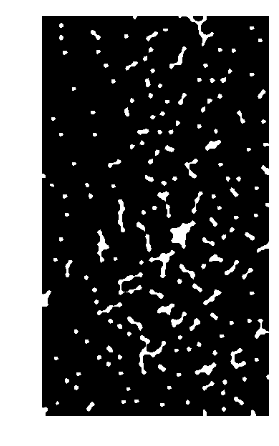

In [14]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,10))
erosion = cv2.erode(im_bw, kernel, iterations = 1)
show_gray(erosion)

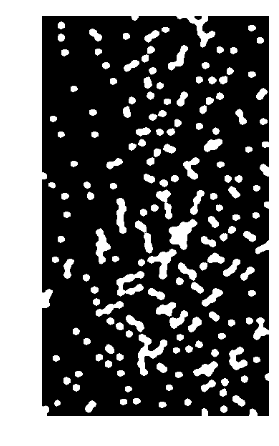

In [15]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
dilation = cv2.dilate(erosion, kernel, iterations = 1)
show_gray(dilation)

Как видно, есть еще участки - кляксы, а не одиночные круги

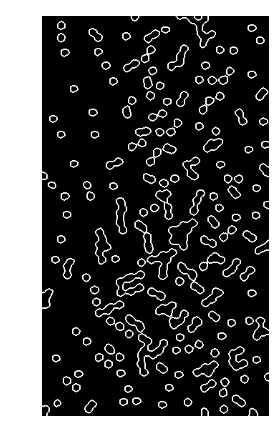

In [16]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
gradient = cv2.morphologyEx(dilation, cv2.MORPH_GRADIENT, kernel)
show_gray(gradient)

Теперь попробуем закрасить круги до тех пор, пока они закрашиваются, при этом некруги должны остаться с пустотой внутри

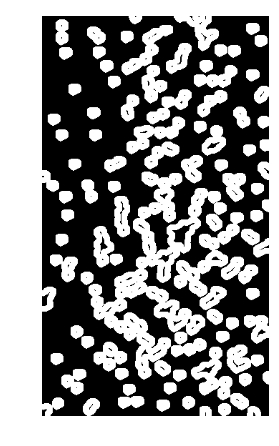

In [17]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4,4))
dilation = cv2.dilate(gradient, kernel, iterations = 2)
show_gray(dilation)

Ну вот, теперь снова можно сделать erosion по кургу и потом dilatation

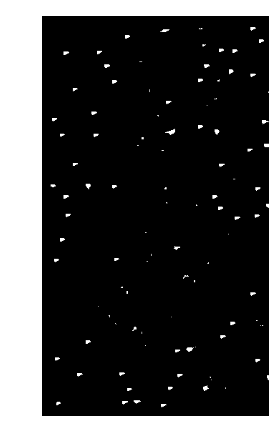

In [18]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (12,12))
erosion = cv2.erode(dilation, kernel, iterations = 1)
show_gray(erosion)

Итого, вот результат: остались только одиночные круглые частицы, ну почти :)

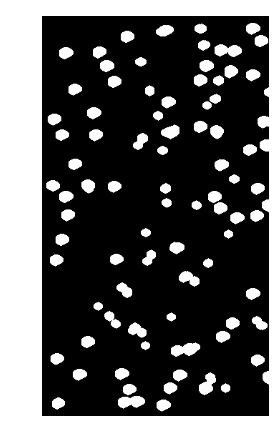

In [19]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
dilation = cv2.dilate(erosion, kernel, iterations = 2)
show_gray(dilation)

Теперь выделим только группы перекрывающихся частиц

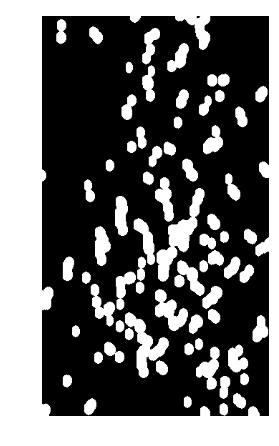

In [20]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10,17))
opening_1 = cv2.morphologyEx(im_bw, cv2.MORPH_OPEN, kernel)
show_gray(opening_1)

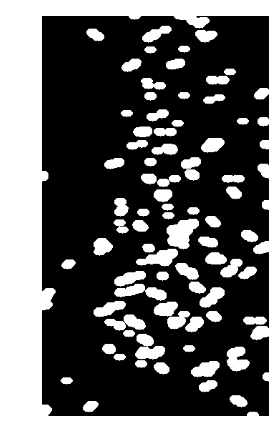

In [21]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (17,10))
opening_2 = cv2.morphologyEx(im_bw, cv2.MORPH_OPEN, kernel)
show_gray(opening_2)

Итого, вот результат

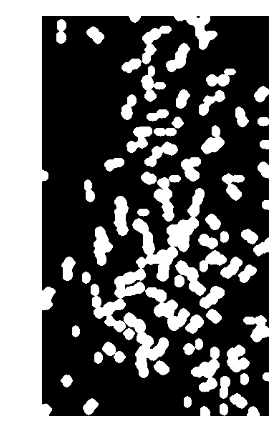

In [22]:
dst = cv2.addWeighted( opening_1, 1, opening_2, 2, 0.0)
show_gray(dst)

Теперь выделим те частицы, что касаются края изображения

In [23]:
connectivity = 4  
# Perform the operation
output = cv2.connectedComponentsWithStats(im_bw, connectivity, cv2.CV_32S)
# Get the results
# The first cell is the number of labels
num_labels = output[0]
# The second cell is the label matrix
labels = output[1]
# The third cell is the stat matrix
stats = output[2]
# The fourth cell is the centroid matrix
centroids = output[3]

stats содержит разную полузную статистику по компонентам связности, ей и воспользуемся

In [24]:
lab = []
for num in np.arange(num_labels):
    if (num == 0):
        continue
    stat = stats[num]
    if (stat[0] == 0 or stat[1] == 0 or stat[0] + stat[2] == 317 or stat[1] + stat[3] == 561):
        lab.append(num)

In [25]:
circles = cv2.imread("circles.jpg")

circles_edge = np.zeros_like(circles)
for l in lab:
    circles_edge[labels == l] = 255

Итого, вот результат

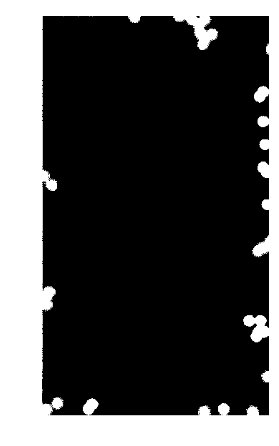

In [26]:
show(circles_edge)

А теперь давайте улучшим результат предыдущих подпунктов

Посчитаем площадь всех прямоугольников, что описаны над компонентами связности и возьмем среднее

In [27]:
areas = []
for num in np.arange(num_labels):
    if (num == 0):
        continue
    stat = stats[num]
    area = stat[4]
    areas.append(area)

In [28]:
areas_arr = np.array(areas)

То есть вот среднее, будем отсекать частицы от смешанных частиц примерно по этому числу

In [29]:
np.mean(areas_arr)

331.67261904761904

In [30]:
lab = []
for num in np.arange(num_labels):
    if (num == 0):
        continue
    stat = stats[num]
    area = stat[4]
    if (area < 310 and stat[1] != 0 and stat[0] + stat[2] != 317 and stat[1] + stat[3] != 561):
        lab.append(num)

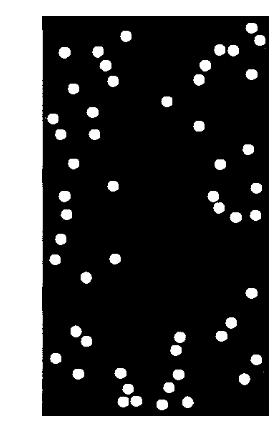

In [31]:
circles = cv2.imread("circles.jpg")

circles_single = np.zeros_like(circles)
for l in lab:
    circles_single[labels == l] = 255
    
show(circles_single)    

In [32]:
lab = []
for num in np.arange(num_labels):
    if (num == 0):
        continue
    stat = stats[num]
    area = stat[4]
    if (area > 310 and stat[1] != 0 and stat[0] + stat[2] != 317 and stat[1] + stat[3] != 561):
        lab.append(num)

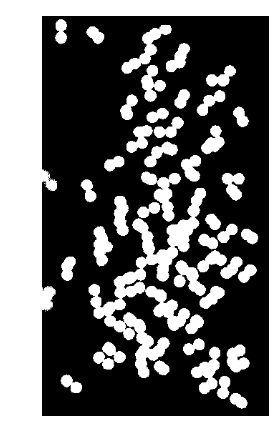

In [33]:
circles = cv2.imread("circles.jpg")

circles_merged = np.zeros_like(circles)
for l in lab:
    circles_merged[labels == l] = 255
    
show(circles_merged)    

Итого, вот окончательный ответ

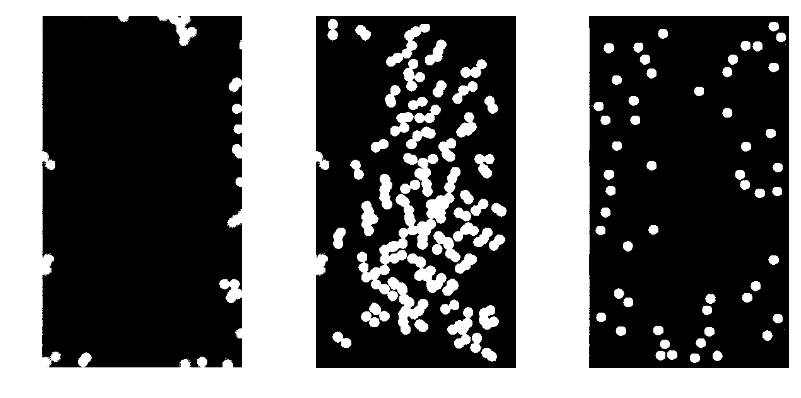

In [34]:
show_imgs([circles_edge, circles_merged, circles_single])

**5. (5 баллов) ** Отделите монеты от фона на изображении $coins\_1.jpg$, отсортируйте монеты по убыванию размера. Сгенерируйте результирующее изображение с цветной разметкой областей, соответствующих монетам на исходном изображении: на черном фоне должны быть выделены разными цветами области, соответствующие монетам. В центре каждой выделенной области разместите порядковый номер монеты в соответствии с сортировкой монет по размеру (в центре области, соответствующей самой большой монете, должно стоять число 1)

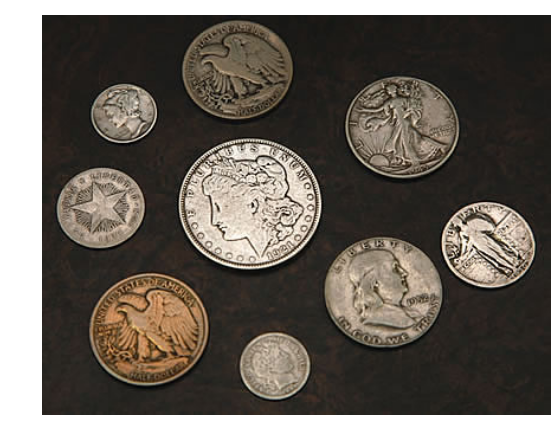

In [2]:
coins_1 = cv2.imread("coins_1.jpg")
show(coins_1)

Сначал бинаризуем

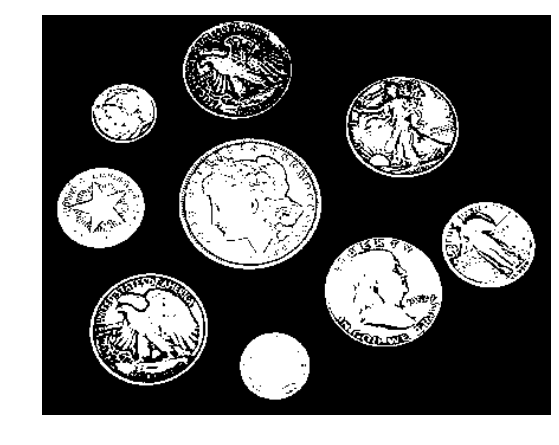

In [4]:
coins_1 = cv2.imread("coins_1.jpg")
im_gray = cv2.cvtColor(coins_1, cv2.COLOR_BGR2GRAY)
thresh, im_bw = cv2.threshold(im_gray, 100, 255, cv2.THRESH_OTSU)
show_gray(im_bw)

Теперь сделаем dilation для того, чтобы выделить круги

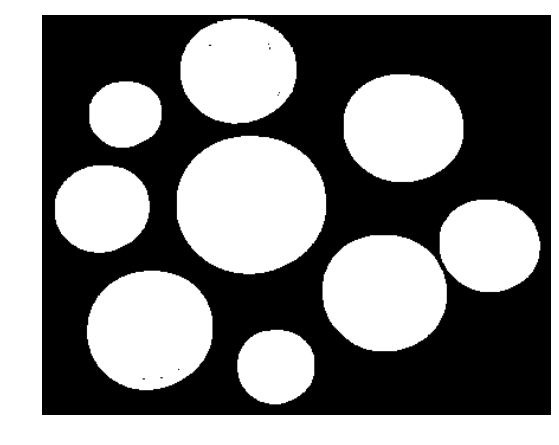

In [5]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(4,4))
dilation = cv2.dilate(im_bw, kernel, iterations = 2)
show_gray(dilation)

Теперь можно пойти тремя!!! путями(оставлю здесь все 3 способа, в конце лишь скажу, какой мне больше понравился): 1) использовать мой реализованный алгоритм для выделения компонент связности

start first
end first
start second
end second
number of components 9


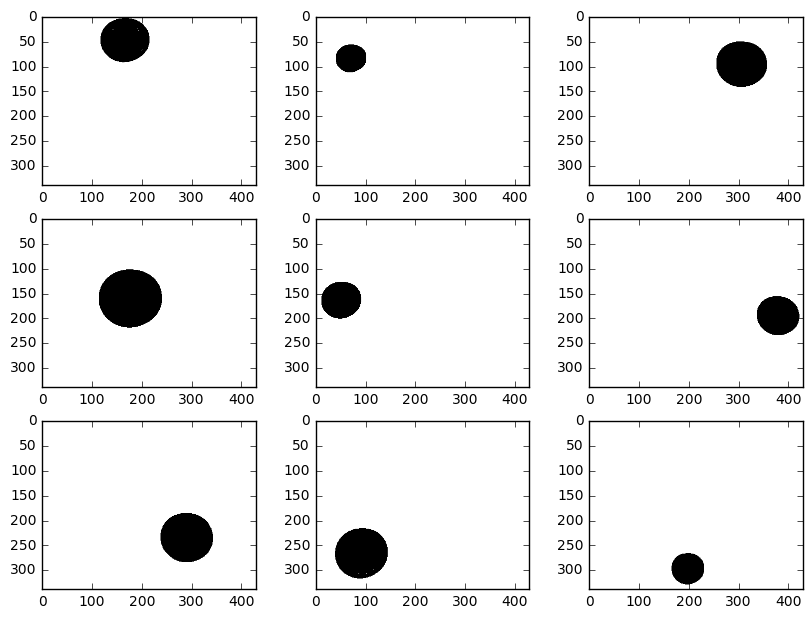

In [38]:
struct = np.ndarray(shape=(3,3), buffer=np.array([[0,1,0],[1,1,1],[0,1,0]]), dtype=int)

comps = compound_components(dilation, struct, 0) 
print('number of components', len(comps))
show_imgs_gray(comps)

Как видно их 9 штук и все работает и теперь разукрасить выделенные компоненты. Или можно сразу использовать HoughCircles и получить ответ

Первый подход

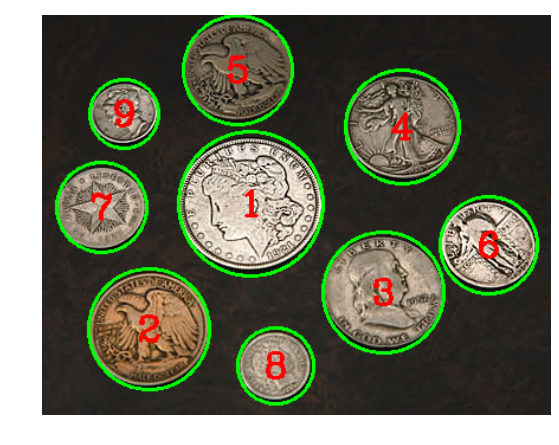

In [39]:
coins_1 = cv2.imread("coins_1.jpg")
def get_radius(src):
    S = (src != 255).sum()
    R = np.sqrt((S / np.pi))
    return R

def get_center(src):
    s1, s2 = src.shape
    
    x = []
    y = []
    for i in np.arange(s1):
        for j in np.arange(s2):
            if (src[i][j] != 255):
                x.append(j)
                y.append(i)

    return  np.average(np.array(x)),  np.average(np.array(y))       
  
all_radius = []    
for comp in comps:
    all_radius.append(get_radius(comp))
    
all_radius = np.array(all_radius)    
args = np.argsort(all_radius)

number = 9
for arg in args:
    r = all_radius[arg]
    x, y = get_center(comps[arg])
    cv2.circle(coins_1, ((int)(x), (int)(y)) ,(int)(r) , (0,255,0) ,2)
    cv2.putText(coins_1, str(number) ,((int)(x) - 10,(int)(y) + 10), 3, 1, (0,0,255), 2)
    number -= 1
show(coins_1)  

Второй подход

(1, 9, 3)


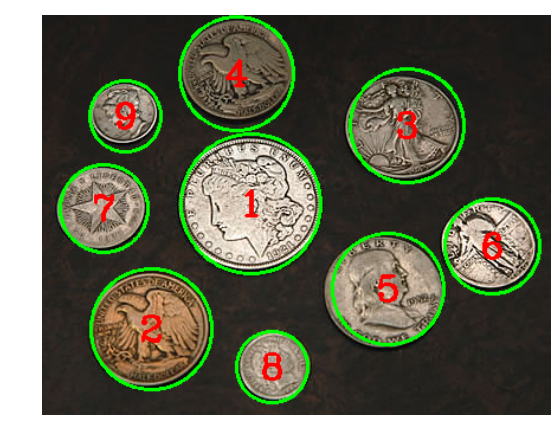

In [40]:
coins_1 = cv2.imread("coins_1.jpg")
circles = cv2.HoughCircles(dilation ,cv2.HOUGH_GRADIENT, 3, 80,
                            param1=30, param2=50, minRadius=10, maxRadius=63)

circles = np.uint16(np.around(circles))
print(circles.shape)

circles = circles.tolist()
lst = circles[0]

lst.sort(key=lambda x: x[2])

r = 9
for i in lst:
    cv2.circle(coins_1, (i[0],i[1]) ,i[2], (0,255,0) ,2)
    cv2.putText(coins_1, str(r) ,(i[0] - 10,i[1] + 10), 3, 1, (0,0,255), 2)
    r -= 1
show(coins_1)    

Третий подход: сначала найти контуры

9


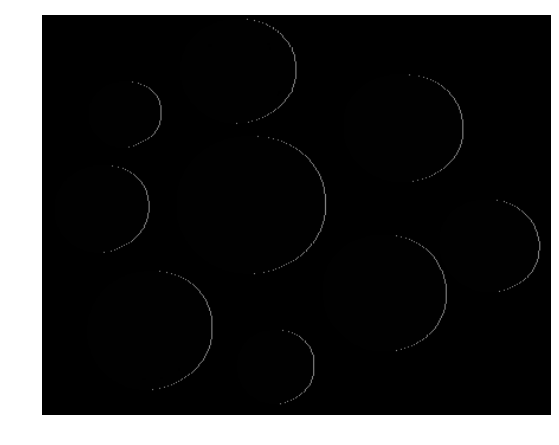

In [6]:
src, contours, hierarchy = cv2.findContours(dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
print(len(contours))
show_gray(src)

И потом обвести их эллипсами

In [42]:
coins_1 = cv2.imread("coins_1.jpg")

areas = []
moments = []
for cnt in contours:
    M = cv2.moments(cnt)
    moments.append(M)
    area = cv2.contourArea(cnt)
    areas.append(area)

    ellipse = cv2.fitEllipse(cnt)
    cv2.ellipse(coins_1, ellipse, (0,255,0), 2)
    
areas  = np.array(areas)
args = np.argsort(areas)

r = 9    
for arg in args:
    
    M = moments[arg]
    cX = int(M["m10"] / M["m00"])
    cY = int(M["m01"] / M["m00"])
    cv2.putText(coins_1, str(r) ,( cX - 10, cY + 10), 3, 1, (0,0,255), 2)
    r -= 1

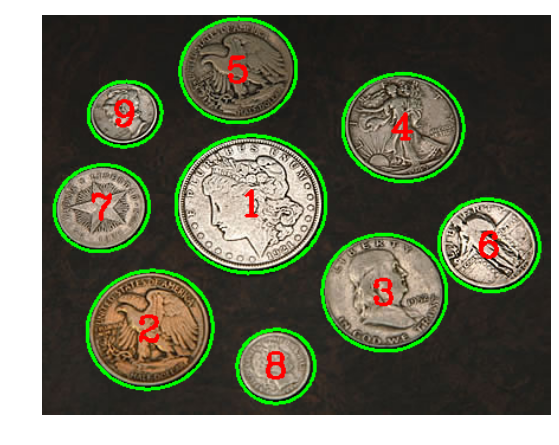

In [43]:
show(coins_1)

Третий способ самый легкий, хотя в первом все было реализовано мной

**6. (5 баллов)** Отделите монеты от текста на изображении $coins\_2.jpg.$ Сгене- рируйте по входному изображению два изображения: на одном должны остаться только монеты, весь текст должен быть удален; на втором изображении должен остаться только текст, все монеты должны быть удалены.

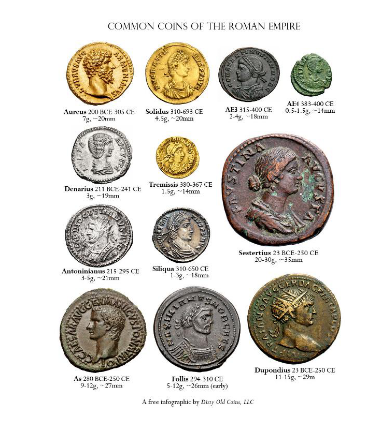

In [44]:
coins_2 = cv2.imread("coins_2.jpg")
show(coins_2)

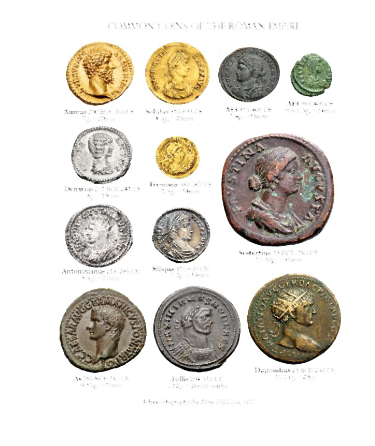

In [45]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
closing = cv2.morphologyEx(coins_2, cv2.MORPH_CLOSE, kernel)
show(closing)

Первый способ такой, но тут результат не очень хороший

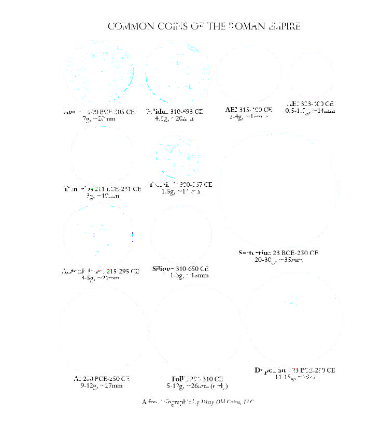

In [46]:
coins_2 = cv2.imread("coins_2.jpg")
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,4))
closing = cv2.morphologyEx(coins_2, cv2.MORPH_CLOSE, kernel)
coins_2[closing != 255] = 255
show(coins_2)

Попробуем дальше, основываясь на полученном closing-е

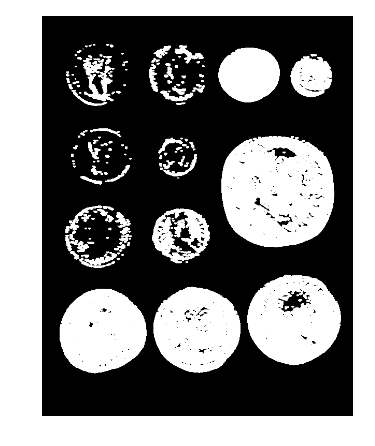

In [47]:
im_gray = cv2.cvtColor(closing, cv2.COLOR_BGR2GRAY)
thresh, im_bw = cv2.threshold(im_gray, 100, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)
show_gray(im_bw)

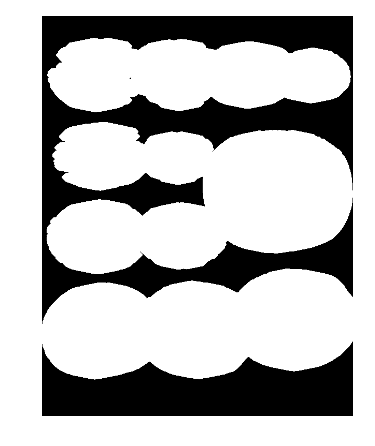

In [48]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(13, 5))
dilation = cv2.dilate(im_bw, kernel, iterations = 6)
show_gray(dilation)

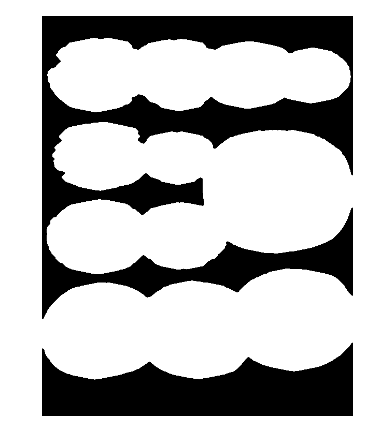

In [49]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
closing = cv2.morphologyEx(dilation, cv2.MORPH_CLOSE, kernel)
show_gray(closing)

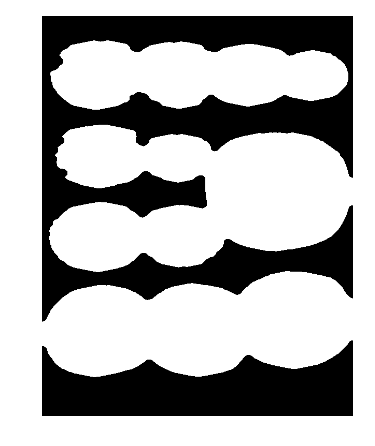

In [50]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (10, 10))
erosing = cv2.morphologyEx(closing, cv2.MORPH_ERODE, kernel)
show_gray(erosing)

Последний штрих: уберем все белые круги

In [51]:
coins_2 = cv2.imread("coins_2.jpg")
coins_2[erosing == 255] = 255

Итого, вот результат

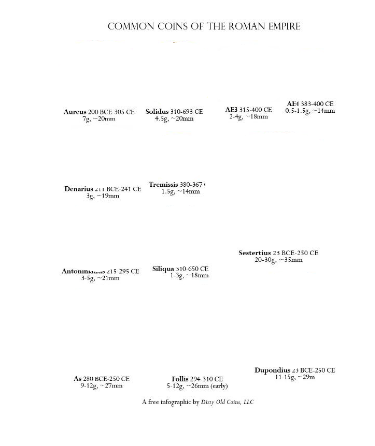

In [52]:
show(coins_2)

**7. (11 баллов) ** Для каждого из зашумленных изображений $coins\_noize\_1.jpg$, $coins\_noize\_2.jpg$, $coins\_noize\_3.jpg$: выделите целые монеты, сгруппируйте их по размеру и посчитайте число монет в каждой группе. На выходе программа должна выдавать полученное число групп монет, средний размер монеты для каждой группы и число монет
в каждой группе, а также изображение, визуализирующее результат. На данном изображении на черном фоне должны быть цветом выделены области, соответствующие монетам. Монеты, принадлежащие одной группе, должны быть обозначены одним и тем же цветом.

In [4]:
from sklearn.cluster import KMeans

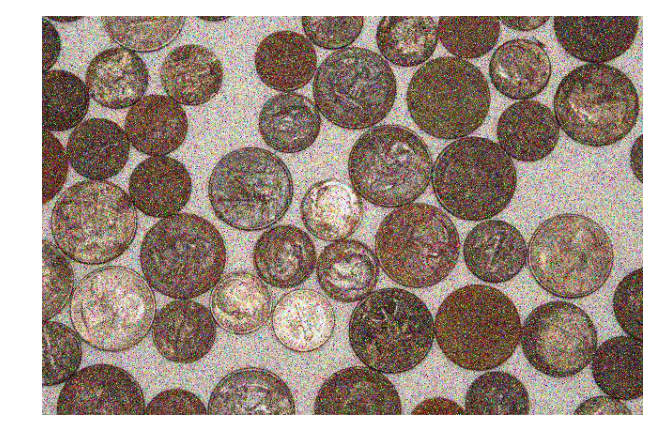

In [5]:
coins_noize_1 = cv2.imread("coins_noize_1.jpg")
show(coins_noize_1)

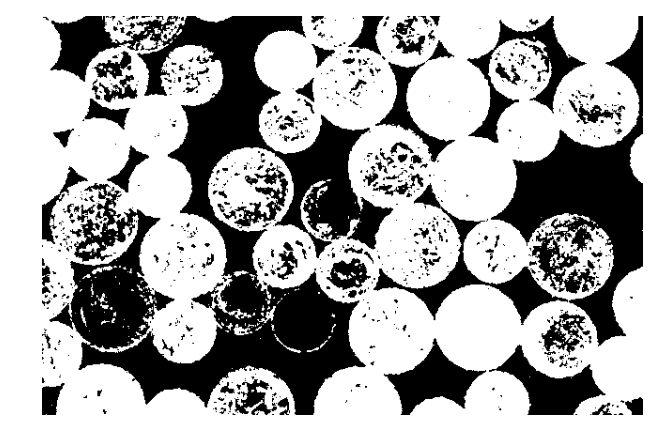

In [6]:
gray = cv2.cvtColor(coins_noize_1, cv2.COLOR_BGR2GRAY)
median_blur = cv2.medianBlur(gray, 3)
thresh, im_bw = cv2.threshold(median_blur, 100, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

show_gray(im_bw)

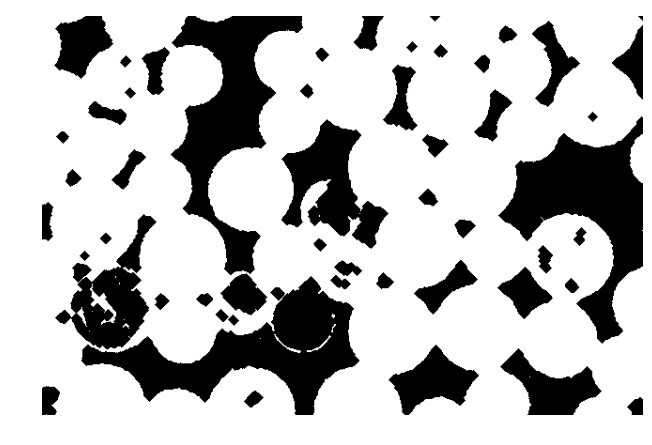

In [10]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
closing = cv2.morphologyEx(im_bw, cv2.MORPH_CLOSE, kernel, iterations=5)
show_gray(closing)

(1, 35, 3)


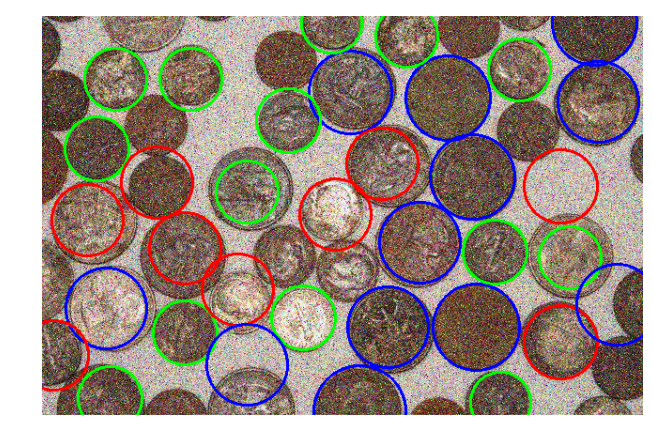

In [57]:
coins_noize_1 = cv2.imread("coins_noize_1.jpg")
circles = cv2.HoughCircles(closing, cv2.HOUGH_GRADIENT, 5, 70,
                            param1=30, param2=60, minRadius=30, maxRadius=50)

circles = np.uint16(np.around(circles))
print(circles.shape)

circles = circles.tolist()
lst = circles[0]

rad_lst = []
for i in lst:
    rad_lst.append([i[2]])
    
X = rad_lst
kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
labels = kmeans.labels_    

j = 0
for i in lst:
    if (labels[j] == 0):
        cv2.circle(coins_noize_1, (i[0],i[1]) ,i[2], (0,255,0) ,2)
    if (labels[j] == 1):
        cv2.circle(coins_noize_1, (i[0],i[1]) ,i[2], (255,0,0) ,2)
    if (labels[j] == 2):
        cv2.circle(coins_noize_1, (i[0],i[1]) ,i[2], (0,0,255) ,2)    
    j += 1
show(coins_noize_1)    

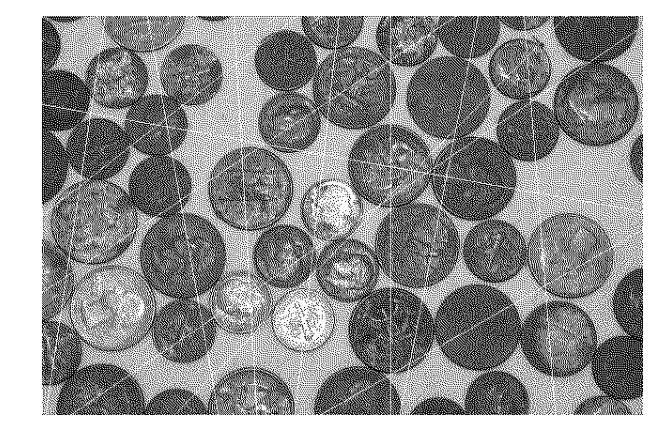

In [58]:
coins_noize_2 = cv2.imread("coins_noize_2.jpg")
show(coins_noize_2)

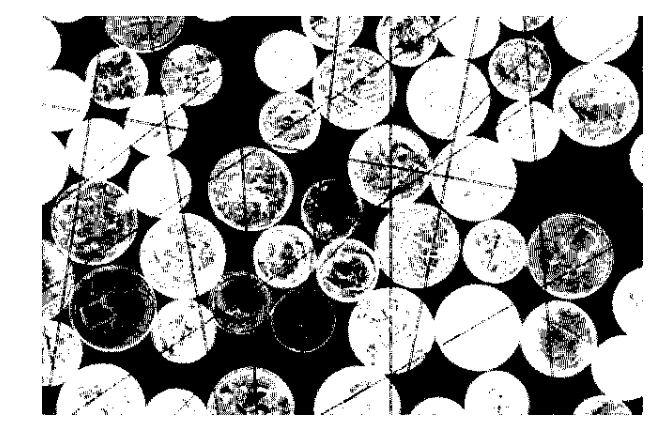

In [59]:
gray = cv2.cvtColor(coins_noize_2, cv2.COLOR_BGR2GRAY)
gray_blur = cv2.GaussianBlur(gray, (3, 3), 7)
thresh, im_bw = cv2.threshold(gray_blur, 100, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

show_gray(im_bw)

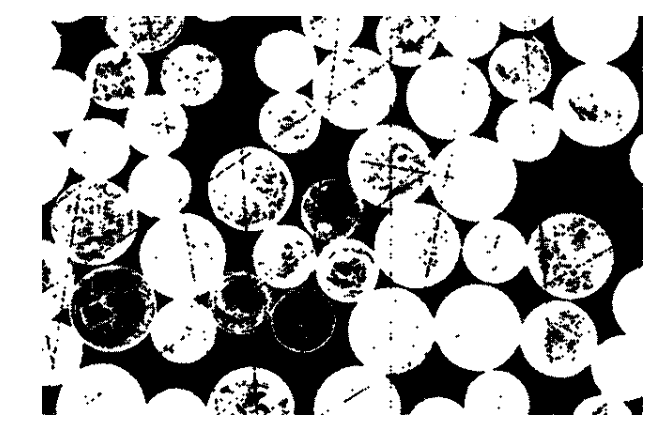

In [60]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
closing = cv2.morphologyEx(im_bw, cv2.MORPH_CLOSE, kernel, iterations=1)
show_gray(closing)

(1, 30, 3)


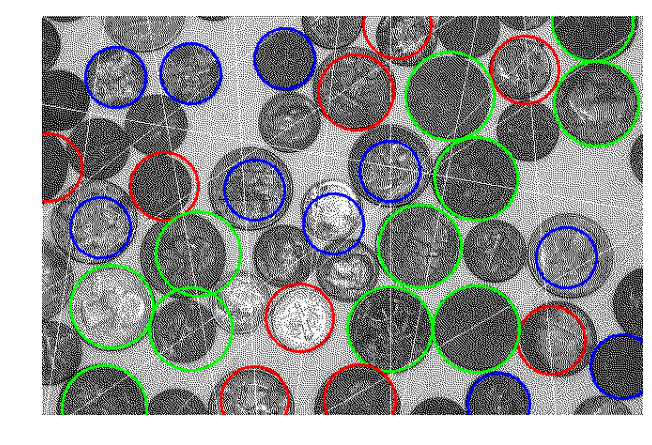

In [61]:
coins_noize_2 = cv2.imread("coins_noize_2.jpg")
circles = cv2.HoughCircles(closing, cv2.HOUGH_GRADIENT, 4, 80,
                            param1=30, param2=60, minRadius=30, maxRadius=50)

circles = np.uint16(np.around(circles))
print(circles.shape)

circles = circles.tolist()
lst = circles[0]

rad_lst = []
for i in lst:
    rad_lst.append([i[2]])
    
X = rad_lst
kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
labels = kmeans.labels_    

j = 0
for i in lst:
    if (labels[j] == 0):
        cv2.circle(coins_noize_2, (i[0],i[1]) ,i[2], (0,255,0) ,2)
    if (labels[j] == 1):
        cv2.circle(coins_noize_2, (i[0],i[1]) ,i[2], (255,0,0) ,2)
    if (labels[j] == 2):
        cv2.circle(coins_noize_2, (i[0],i[1]) ,i[2], (0,0,255) ,2)    
    j += 1
show(coins_noize_2)    

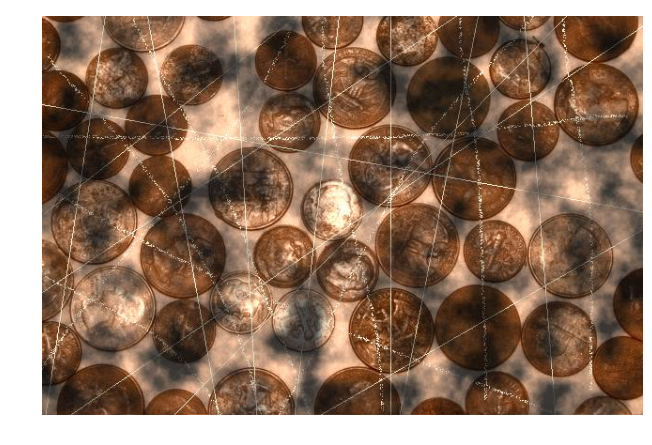

In [62]:
coins_noize_3 = cv2.imread("coins_noize_3.jpg")
show(coins_noize_3)

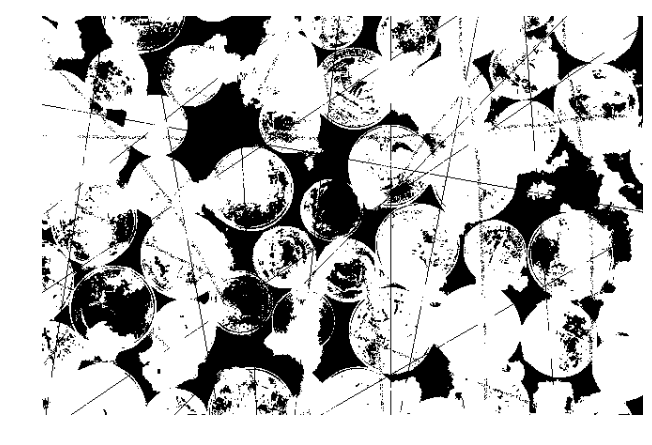

In [63]:
gray = cv2.cvtColor(coins_noize_3, cv2.COLOR_BGR2GRAY)
gray_blur = cv2.GaussianBlur(gray, (5, 5), 0)
thresh, im_bw = cv2.threshold(gray, 100, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)

show_gray(im_bw)

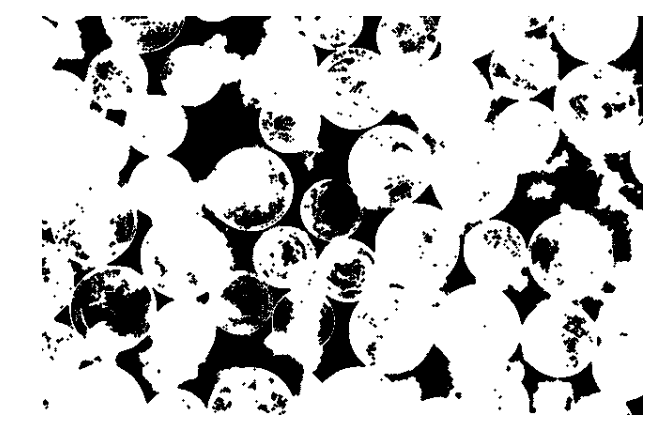

In [64]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
closing = cv2.morphologyEx(im_bw, cv2.MORPH_CLOSE, kernel, iterations=1)
show_gray(closing)

(1, 35, 3)


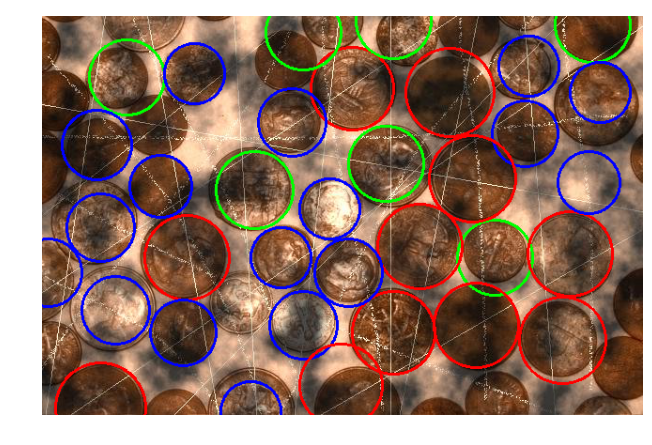

In [65]:
coins_noize_3 = cv2.imread("coins_noize_3.jpg")
circles = cv2.HoughCircles(closing, cv2.HOUGH_GRADIENT, 4, 70,
                            param1=30, param2=60, minRadius=30, maxRadius=50)

circles = np.uint16(np.around(circles))
print(circles.shape)

circles = circles.tolist()
lst = circles[0]

rad_lst = []
for i in lst:
    rad_lst.append([i[2]])
    
X = rad_lst
kmeans = KMeans(n_clusters=3, random_state=0).fit(X)
labels = kmeans.labels_    

j = 0
for i in lst:
    if (labels[j] == 0):
        cv2.circle(coins_noize_3, (i[0],i[1]) ,i[2], (0,255,0) ,2)
    if (labels[j] == 1):
        cv2.circle(coins_noize_3, (i[0],i[1]) ,i[2], (255,0,0) ,2)
    if (labels[j] == 2):
        cv2.circle(coins_noize_3, (i[0],i[1]) ,i[2], (0,0,255) ,2)    
    j += 1
show(coins_noize_3)    

**8. (5 баллов) ** Для каждого из зашумленных изображений $coins\_noize\_1.jpg$, $coins\_noize\_2.jpg$, $coins\_noize\_3.jpg$: задача аналогична предыдущей, только считать надо не только целые монеты, но и обрезанные краем изображения.

In [1]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [16]:
new_docs = ['He watches basketball and baseball', 
            'Julie likes to play basketball', 
            'Jane loves to play baseball']
tf = TfidfVectorizer()
new_term_freq_matrix = tf.fit_transform(new_docs)

In [14]:
new_term_freq_matrix.toarray()

array([[ 0.49047908,  0.37302199,  0.37302199,  0.49047908,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.49047908],
       [ 0.        ,  0.        ,  0.3935112 ,  0.        ,  0.        ,
         0.51741994,  0.51741994,  0.        ,  0.3935112 ,  0.3935112 ,
         0.        ],
       [ 0.        ,  0.3935112 ,  0.        ,  0.        ,  0.51741994,
         0.        ,  0.        ,  0.51741994,  0.3935112 ,  0.3935112 ,
         0.        ]])

In [18]:
tf.vocabulary_

{'and': 0,
 'baseball': 1,
 'basketball': 2,
 'he': 3,
 'jane': 4,
 'julie': 5,
 'likes': 6,
 'loves': 7,
 'play': 8,
 'to': 9,
 'watches': 10}

В предыдущем, используя cv2.HoughCircles, я считал сразу и те монеты, что возле края, где-то действительно получилось их выделить